In [1]:
from deepface import DeepFace
import cv2
import pandas as pd
import matplotlib.pyplot as plt
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import decode_predictions
from keras.applications.vgg16 import VGG16

from utilities import detect_beard, detect_shades

In [2]:
# load df from csv
beard_df = pd.read_csv("libraries and test data/data for model tests/All Labels/beards.csv", header=0)

In [3]:
beard_df

,Name,Length,True Age,True Gender,Predict Age,Predict Gender
0,beard01.png,200068,15-25,F,35.0,Woman
1,beard02.png,545947,25-35,M,24.0,Man
2,beard03.png,185065,20-30,F,28.0,Woman
3,beard04.png,666693,20-30,F,24.0,Woman
4,beard05.png,32978,30-40,F,26.0,Woman
5,beard06.png,504711,30-40,M,25.0,Man
6,beard07.png,533656,30-40,M,23.0,Man
7,beard08.png,602570,40-50,F,40.0,Woman
8,beard09.png,598072,30-40,F,34.0,Woman
9,beard10.png,557091,20-30,F,30.0,Woman


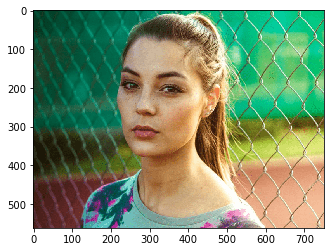

In [4]:
# folder_loc='eyeblink data labels/data/Feature1_data/'

# Correct:
# bbbbbbbbbb0.png   29, Woman
# dddddddddd9.png   35, Man
# aaaaaaaaaa1.png - 30, Man
# eeeeeeeeee1.png   32, Woman
# novarhxpbj149.png 45, Woman

# Incorrect:
# dpevefkefv34.png  35, Man (should be Woman)
# adohdulfwb5.png - 34, Man (should be Woman)
# adohdulfwb41.png  33, Man (should be Woman)
# adohdulfwb99.png  33, Man (should be Woman)

# Deepface has a harder time recognizing women.

folder1_loc='libraries and test data/data for model tests/Beards/'

# to get the next image, increase the value of img1_index
img_index=0

# show the image
img1_path = folder1_loc+str(beard_df['Name'].iloc[img_index])
img1 = cv2.imread(img1_path)
plt.imshow(img1[:, :, ::-1 ]) 
plt.show() 

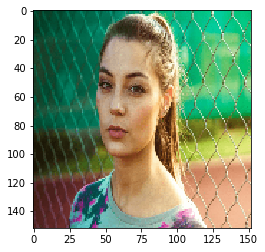

In [5]:
# DeepFace expects a 152 by 152 sized image as input
dimensions=(152,152)
resized=cv2.resize(img1, dimensions)

# Save this image to a temporary directory for later input to DeepFace
folder2_loc='eyeblink data labels/data/temp/'
img2_name = 'beard.png'
img2_path = folder2_loc + img2_name
cv2.imwrite(img2_path, resized)
plt.imshow(resized[:, :, ::-1 ])
plt.show()

In [6]:
# Run DeepFace via the detect_beard function
result1, result2 = detect_beard(img2_path)

Action: gender: 100%|██████████| 2/2 [00:09<00:00,  4.83s/it]

   Age: 35
Gender: Woman


In [7]:
beard_df.loc[img_index, 'Predict Age'] = result1
beard_df.loc[img_index, 'Predict Gender'] = result2

In [8]:
beard_df.to_csv("libraries and test data/data for model tests/All Labels/beards.csv", index=False)

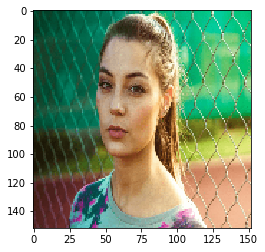

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.63it/s]


   Age: 35
Gender: Woman


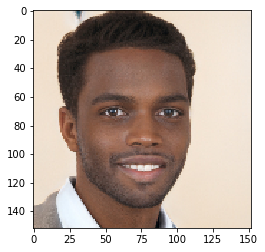

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]


   Age: 24
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


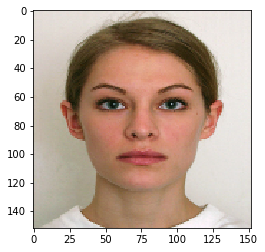

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]


   Age: 28
Gender: Woman


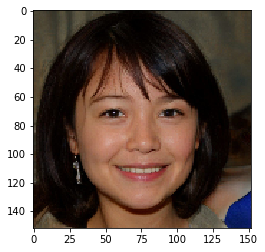

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s]


   Age: 24
Gender: Woman


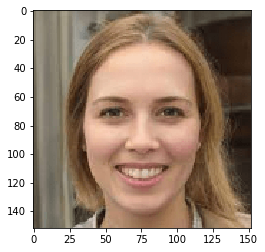

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]


   Age: 26
Gender: Woman


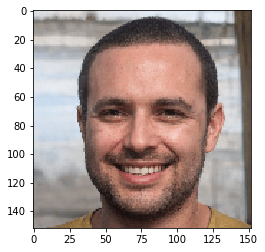

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]


   Age: 25
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


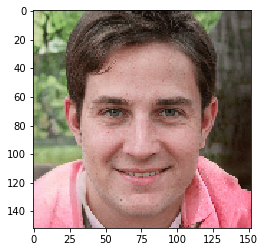

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.69it/s]


   Age: 23
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


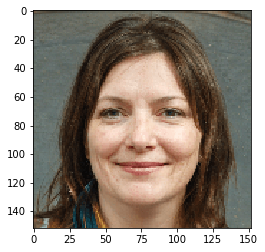

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s]


   Age: 40
Gender: Woman


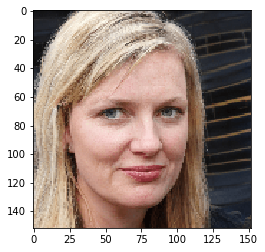

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s]


   Age: 34
Gender: Woman


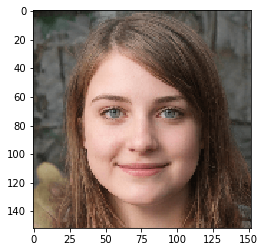

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.58it/s]


   Age: 30
Gender: Woman


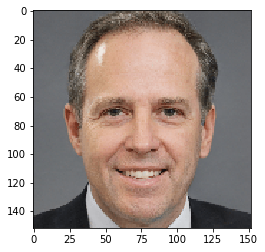

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.89it/s]


   Age: 29
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


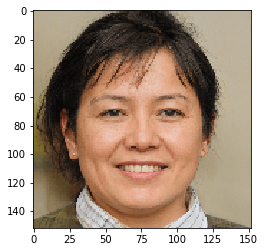

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s]


   Age: 34
Gender: Woman


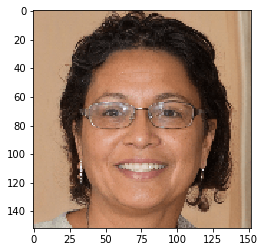

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s]


   Age: 41
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


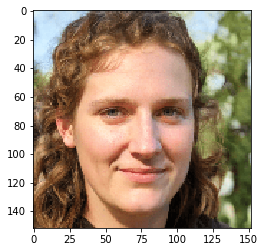

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]


   Age: 24
Gender: Woman


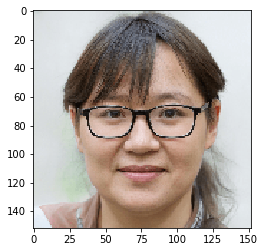

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.09it/s]


   Age: 28
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


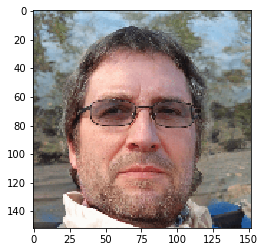

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]


   Age: 38
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


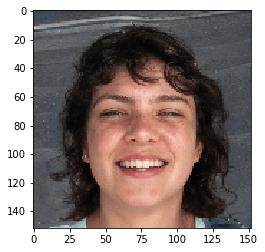

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s]


   Age: 32
Gender: Woman


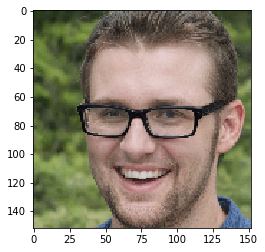

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]


   Age: 26
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


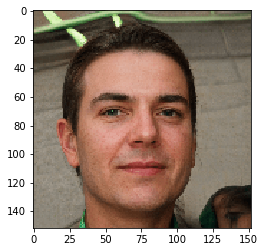

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]


   Age: 25
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


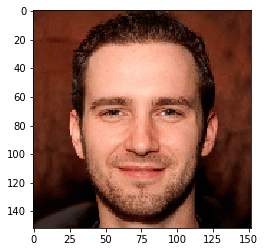

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.83it/s]


   Age: 25
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


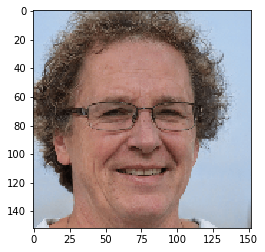

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]


   Age: 28
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


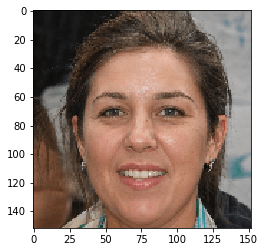

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]


   Age: 30
Gender: Woman


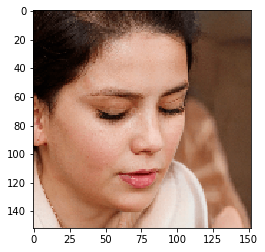

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s]


   Age: 29
Gender: Woman


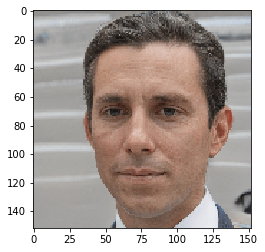

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]


   Age: 28
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


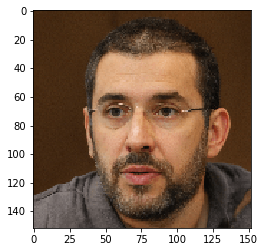

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]


   Age: 34
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


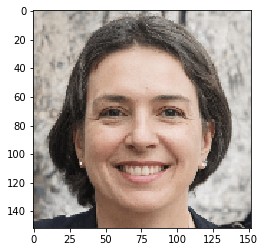

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]


   Age: 25
Gender: Woman


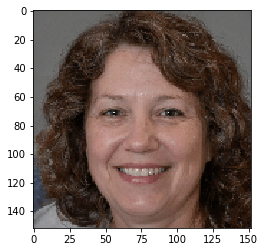

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]


   Age: 37
Gender: Woman


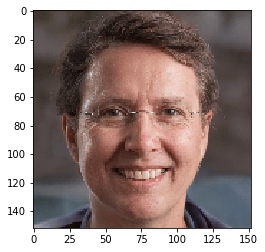

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s]


   Age: 35
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


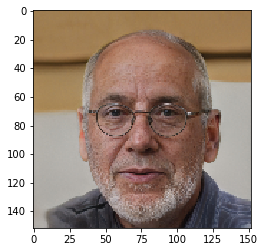

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]


   Age: 51
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


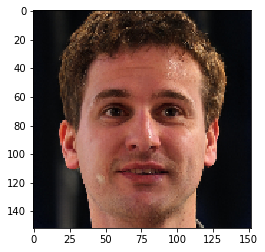

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]


   Age: 34
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


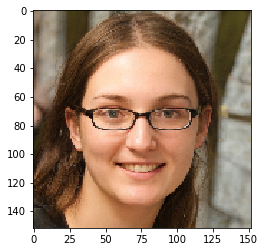

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]


   Age: 31
Gender: Woman


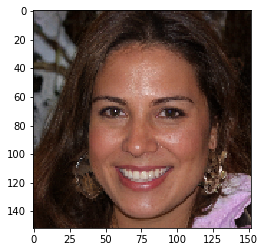

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]


   Age: 28
Gender: Woman


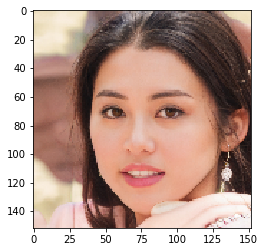

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]


   Age: 31
Gender: Woman


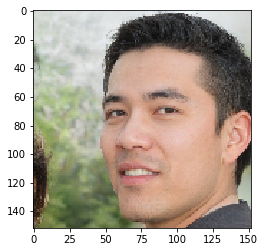

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]


   Age: 28
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


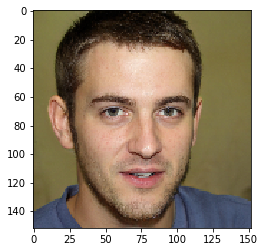

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.80it/s]


   Age: 24
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


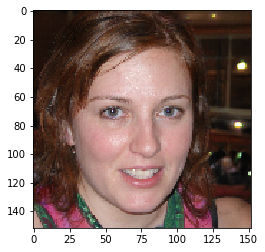

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s]


   Age: 32
Gender: Woman


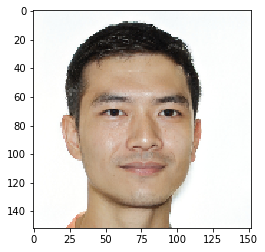

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s]


   Age: 28
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


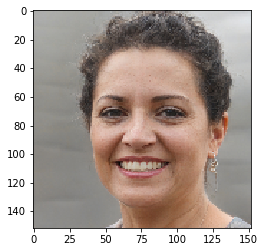

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.92it/s]


   Age: 32
Gender: Woman


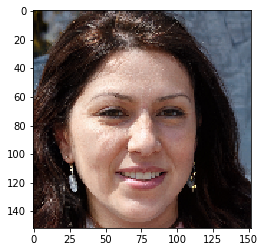

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.92it/s]


   Age: 40
Gender: Woman


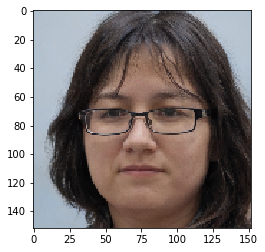

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s]


   Age: 33
Gender: Woman


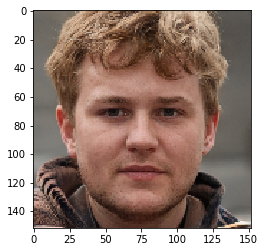

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.81it/s]


   Age: 27
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


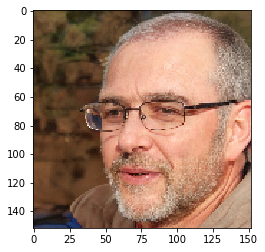

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]


   Age: 50
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


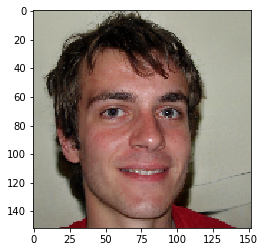

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.87it/s]


   Age: 26
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


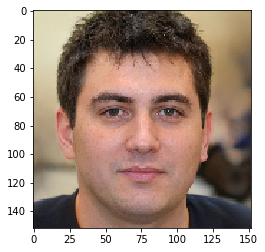

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]


   Age: 24
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


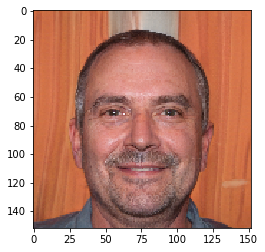

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]


   Age: 38
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


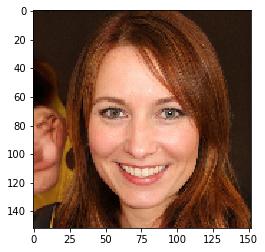

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]


   Age: 29
Gender: Woman


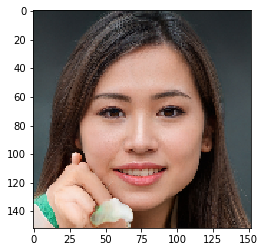

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s]


   Age: 26
Gender: Woman


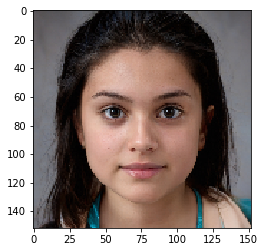

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s]


   Age: 24
Gender: Woman


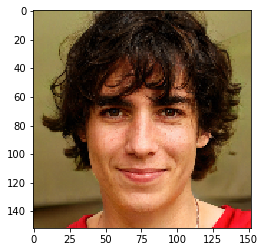

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]


   Age: 23
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


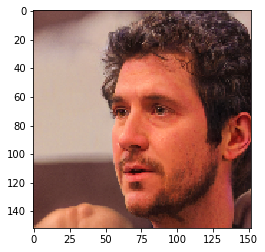

Action: gender: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s]

   Age: 34
Gender: Man
There appears to be an adult male. Beards are hard to deepfake.


In [9]:
# Do everything above, in a loop, to automate the process.
for i in range(0,50):
    img_index=i
    img1_path = folder1_loc+str(beard_df['Name'].iloc[img_index])
    img1 = cv2.imread(img1_path)
    resized=cv2.resize(img1, dimensions)
    cv2.imwrite(img2_path, resized)
    plt.imshow(resized[:, :, ::-1 ])
    plt.show()
    result1, result2 = detect_beard(img2_path)
    beard_df.loc[img_index, 'Predict Age'] = result1
    beard_df.loc[img_index, 'Predict Gender'] = result2
    beard_df.to_csv("libraries and test data/data for model tests/All Labels/beards.csv", index=False)

In [10]:
# load df from csv
shades_df = pd.read_csv("libraries and test data/data for model tests/All Labels/sunglasses_shades.csv", header=0)

In [11]:
shades_df

,Name,Length,Predict (%)
0,sunglasses01.png,303346,9.36
1,sunglasses02.png,373085,42.96
2,sunglasses03.png,447189,28.47
3,sunglasses04.png,56118,42.80
4,sunglasses05.png,113727,30.52
5,sunglasses06.png,43662,46.21
6,sunglasses07.png,52783,27.84
7,sunglasses08.png,45249,71.86
8,sunglasses09.png,160319,16.95
9,sunglasses10.png,56236,47.24


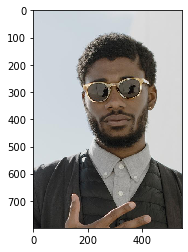

In [12]:
folder3_loc='libraries and test data/data for model tests/Sunglasses/Shades/'

# to get the next image, increase the value of img3_index
img3_index=0

# show the image
img3_path = folder3_loc+str(shades_df['Name'].iloc[img3_index])
img3 = cv2.imread(img3_path)
plt.imshow(img3[:, :, ::-1 ]) 
plt.show() 

In [13]:
result3=detect_shades(img3_path)

Top 5 Object Detection Predictions
suit (25.84%)
Windsor_tie (16.53%)
bow_tie (9.82%)
sunglasses (9.36%)
sunglass (7.97%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


In [14]:
shades_df.loc[img3_index, 'Predict (%)'] = result3

In [15]:
shades_df.to_csv("libraries and test data/data for model tests/All Labels/sunglasses_shades.csv", index=False)

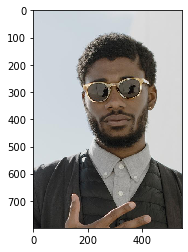

Top 5 Object Detection Predictions
suit (25.84%)
Windsor_tie (16.53%)
bow_tie (9.82%)
sunglasses (9.36%)
sunglass (7.97%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


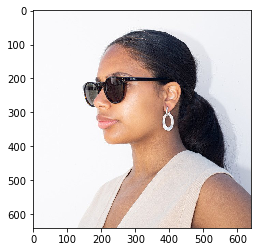

Top 5 Object Detection Predictions
sunglass (45.19%)
sunglasses (42.96%)
wig (1.40%)
neck_brace (0.94%)
lab_coat (0.72%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


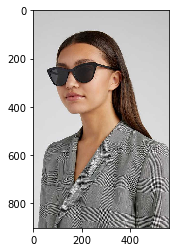

Top 5 Object Detection Predictions
sunglasses (28.47%)
sunglass (23.13%)
trench_coat (5.98%)
stole (4.48%)
suit (4.45%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


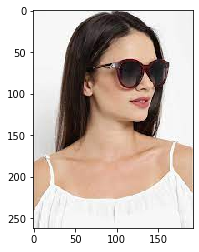

Top 5 Object Detection Predictions
sunglasses (42.80%)
sunglass (34.07%)
brassiere (4.15%)
maillot (3.16%)
miniskirt (3.13%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


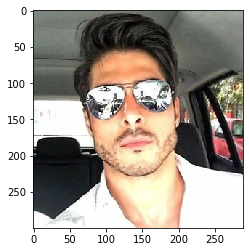

Top 5 Object Detection Predictions
seat_belt (56.35%)
sunglasses (30.52%)
sunglass (7.36%)
minibus (3.11%)
car_mirror (0.96%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


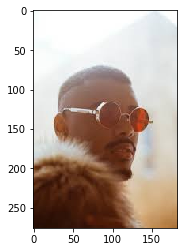

Top 5 Object Detection Predictions
sunglasses (46.21%)
sunglass (41.97%)
maraca (0.58%)
fly (0.55%)
fur_coat (0.44%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


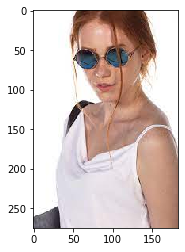

Top 5 Object Detection Predictions
sunglass (31.35%)
sunglasses (27.84%)
lab_coat (17.23%)
maillot (2.74%)
brassiere (1.90%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


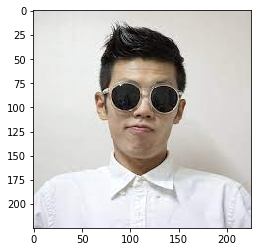

Top 5 Object Detection Predictions
sunglasses (71.86%)
sunglass (24.92%)
lab_coat (1.21%)
bow_tie (0.28%)
suit (0.15%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


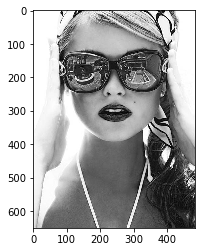

Top 5 Object Detection Predictions
sunglass (39.41%)
sunglasses (16.95%)
mask (3.22%)
bathing_cap (2.36%)
military_uniform (2.25%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


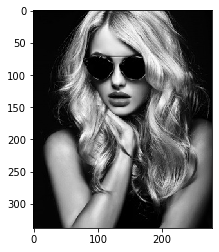

Top 5 Object Detection Predictions
sunglasses (47.24%)
sunglass (43.35%)
wig (1.45%)
brassiere (1.39%)
hair_spray (0.89%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


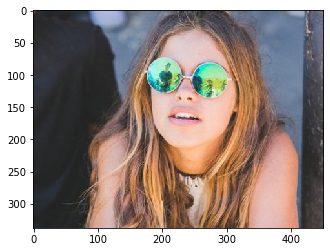

Top 5 Object Detection Predictions
sunglasses (30.40%)
sunglass (27.47%)
wig (6.52%)
jersey (2.36%)
bikini (2.19%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


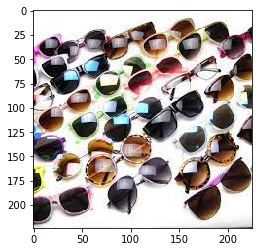

Top 5 Object Detection Predictions
sunglasses (81.73%)
tray (8.66%)
sunglass (5.23%)
trifle (0.45%)
red_wine (0.41%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


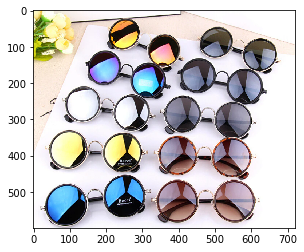

Top 5 Object Detection Predictions
sunglasses (71.44%)
sunglass (7.34%)
necklace (5.89%)
rubber_eraser (1.06%)
tray (1.03%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


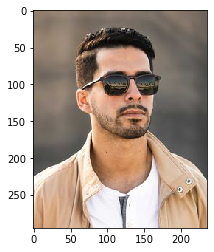

Top 5 Object Detection Predictions
sunglass (31.75%)
sunglasses (13.01%)
military_uniform (9.10%)
suit (2.81%)
racket (2.34%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


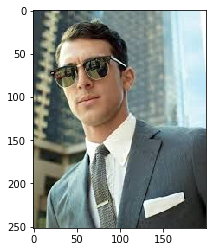

Top 5 Object Detection Predictions
suit (30.11%)
sunglasses (25.48%)
sunglass (24.65%)
Windsor_tie (7.72%)
bow_tie (1.72%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


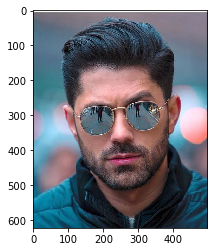

Top 5 Object Detection Predictions
ping-pong_ball (27.09%)
sunglasses (11.10%)
sunglass (10.32%)
pick (5.40%)
stopwatch (3.11%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


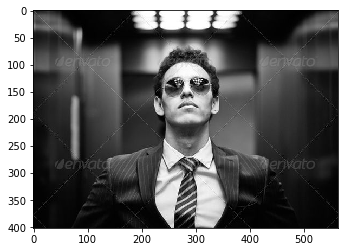

Top 5 Object Detection Predictions
bow_tie (55.58%)
suit (29.49%)
Windsor_tie (9.09%)
groom (1.70%)
microphone (0.36%)
No sunglasses detected.


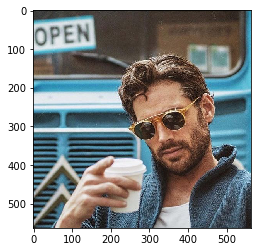

Top 5 Object Detection Predictions
sunglasses (19.79%)
cellular_telephone (11.21%)
sunglass (11.00%)
pay-phone (5.02%)
fur_coat (4.39%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


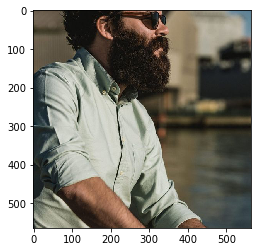

Top 5 Object Detection Predictions
ballplayer (8.27%)
reel (4.46%)
marimba (3.82%)
sunglass (3.13%)
cellular_telephone (2.77%)
No sunglasses detected.


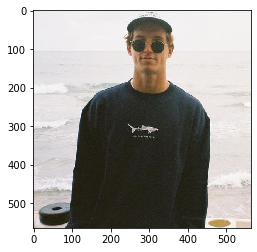

Top 5 Object Detection Predictions
sweatshirt (20.03%)
jersey (7.96%)
abaya (3.23%)
coho (3.08%)
seashore (2.46%)
No sunglasses detected.


In [16]:
# Do everything above, in a loop, to automate the process.
for i in range(0,20):
    img3_index=i
    img3_path = folder3_loc+str(shades_df['Name'].iloc[img3_index])
    img3 = cv2.imread(img3_path)
    plt.imshow(img3[:, :, ::-1 ]) 
    plt.show() 
    result3=detect_shades(img3_path)
    shades_df.loc[img3_index, 'Predict (%)'] = result3
    shades_df.to_csv("libraries and test data/data for model tests/All Labels/sunglasses_shades.csv", index=False)

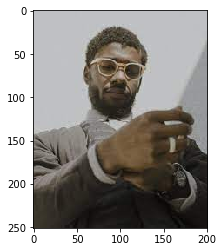

Top 5 Object Detection Predictions
sturgeon (23.17%)
barracouta (7.54%)
bulletproof_vest (6.47%)
assault_rifle (5.96%)
rifle (5.24%)
No sunglasses detected.


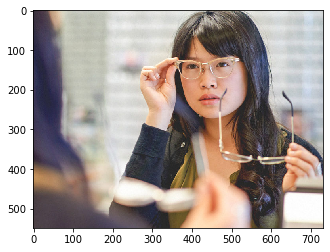

Top 5 Object Detection Predictions
sunglass (7.49%)
cellular_telephone (7.48%)
sunglasses (6.47%)
maillot (5.78%)
lipstick (5.63%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


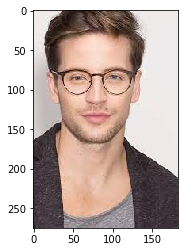

Top 5 Object Detection Predictions
suit (11.80%)
wig (10.91%)
cardigan (3.43%)
bow_tie (3.24%)
stole (3.00%)
No sunglasses detected.


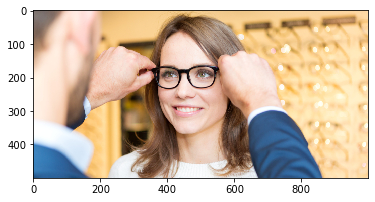

Top 5 Object Detection Predictions
sunglasses (18.60%)
sunglass (13.92%)
hair_spray (7.70%)
jean (6.41%)
cellular_telephone (2.34%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


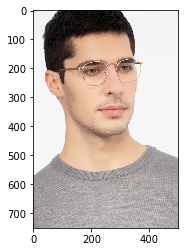

Top 5 Object Detection Predictions
jersey (43.06%)
cardigan (36.19%)
poncho (3.29%)
wool (2.90%)
sweatshirt (2.69%)
No sunglasses detected.


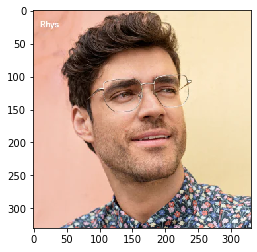

Top 5 Object Detection Predictions
stole (16.94%)
cardigan (11.60%)
poncho (7.79%)
chain_mail (5.70%)
wool (5.47%)
No sunglasses detected.


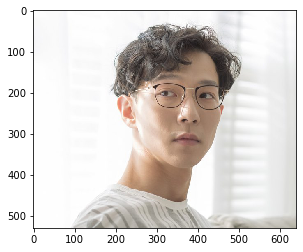

Top 5 Object Detection Predictions
wig (12.57%)
hair_spray (5.98%)
jersey (5.29%)
maillot (3.31%)
jean (3.03%)
No sunglasses detected.


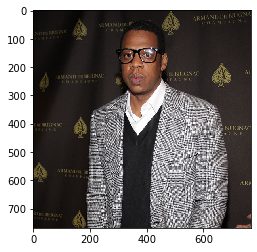

Top 5 Object Detection Predictions
suit (68.79%)
Windsor_tie (10.82%)
cardigan (1.80%)
chain_mail (1.30%)
jean (1.13%)
No sunglasses detected.


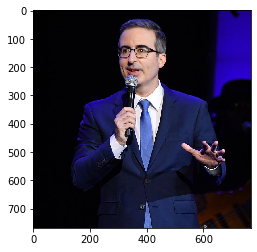

Top 5 Object Detection Predictions
suit (27.19%)
stage (12.03%)
bow_tie (10.45%)
ocarina (7.29%)
oboe (6.83%)
No sunglasses detected.


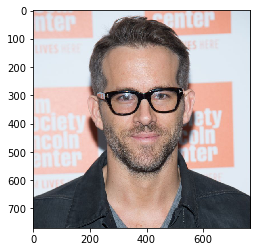

Top 5 Object Detection Predictions
suit (23.69%)
jersey (4.73%)
Windsor_tie (3.40%)
jean (3.22%)
Band_Aid (2.67%)
No sunglasses detected.


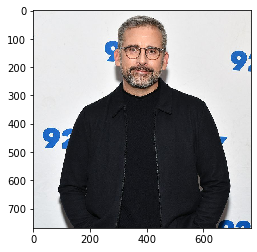

Top 5 Object Detection Predictions
suit (7.91%)
West_Highland_white_terrier (5.44%)
sweatshirt (5.25%)
Kerry_blue_terrier (2.93%)
cardigan (1.97%)
No sunglasses detected.


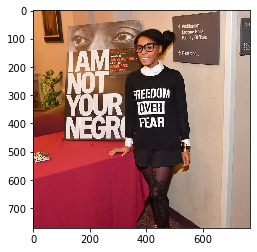

Top 5 Object Detection Predictions
bulletproof_vest (11.30%)
ski_mask (11.06%)
sweatshirt (7.58%)
backpack (5.69%)
cash_machine (4.82%)
No sunglasses detected.


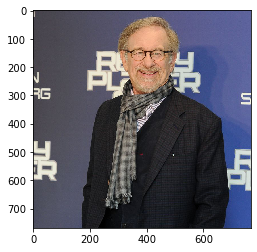

Top 5 Object Detection Predictions
suit (40.86%)
Windsor_tie (15.90%)
stage (6.41%)
bulletproof_vest (5.54%)
sweatshirt (2.51%)
No sunglasses detected.


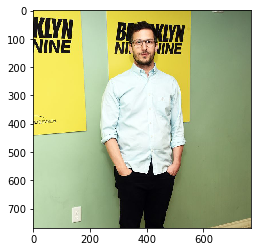

Top 5 Object Detection Predictions
jean (17.60%)
lab_coat (11.32%)
balance_beam (11.13%)
sweatshirt (8.51%)
jersey (4.25%)
No sunglasses detected.


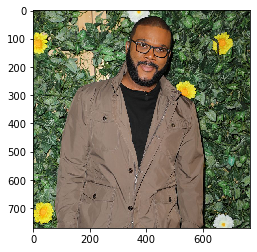

Top 5 Object Detection Predictions
trench_coat (43.49%)
cloak (18.08%)
suit (4.81%)
stole (3.04%)
poncho (1.86%)
No sunglasses detected.


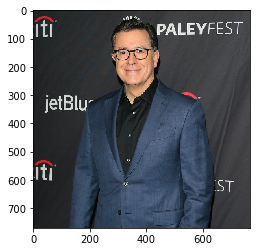

Top 5 Object Detection Predictions
suit (47.90%)
sweatshirt (8.06%)
bulletproof_vest (4.93%)
stage (4.31%)
Windsor_tie (4.05%)
No sunglasses detected.


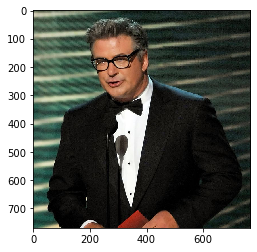

Top 5 Object Detection Predictions
suit (45.38%)
bow_tie (19.21%)
Windsor_tie (5.68%)
cardigan (2.49%)
Sealyham_terrier (2.00%)
No sunglasses detected.


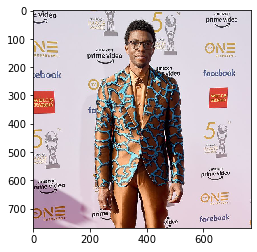

Top 5 Object Detection Predictions
pajama (94.32%)
sarong (2.13%)
web_site (0.83%)
swimming_trunks (0.37%)
maillot (0.35%)
No sunglasses detected.


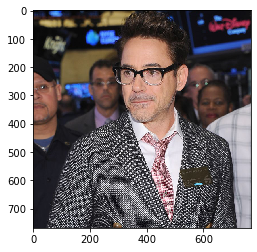

Top 5 Object Detection Predictions
suit (61.50%)
Windsor_tie (22.27%)
chain_mail (4.84%)
kimono (2.57%)
bow_tie (2.19%)
No sunglasses detected.


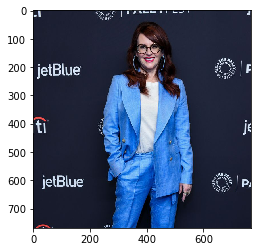

Top 5 Object Detection Predictions
jean (49.24%)
web_site (9.41%)
bow_tie (6.18%)
pajama (4.80%)
sweatshirt (3.97%)
No sunglasses detected.


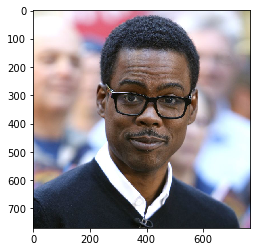

Top 5 Object Detection Predictions
cornet (16.51%)
oboe (13.49%)
suit (12.21%)
mortarboard (7.99%)
French_horn (7.04%)
No sunglasses detected.


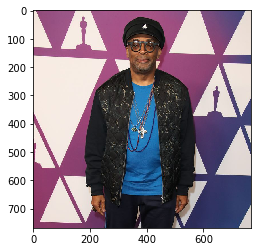

Top 5 Object Detection Predictions
ski (11.02%)
book_jacket (7.03%)
stage (4.70%)
sunglasses (2.19%)
jean (2.17%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


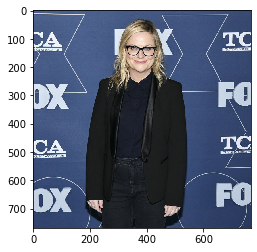

Top 5 Object Detection Predictions
sweatshirt (24.42%)
scoreboard (8.99%)
suit (7.74%)
jersey (5.30%)
comic_book (4.53%)
No sunglasses detected.


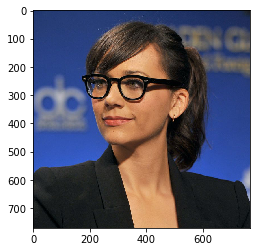

Top 5 Object Detection Predictions
suit (58.90%)
notebook (10.17%)
Windsor_tie (3.70%)
bow_tie (2.97%)
groom (2.44%)
No sunglasses detected.


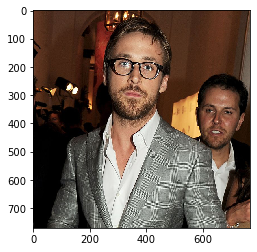

Top 5 Object Detection Predictions
suit (75.30%)
Windsor_tie (15.29%)
groom (2.79%)
bolo_tie (0.85%)
bow_tie (0.82%)
No sunglasses detected.


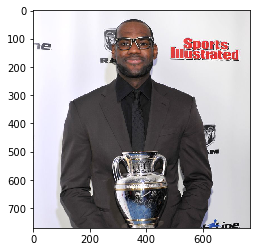

Top 5 Object Detection Predictions
suit (31.37%)
French_horn (13.19%)
cocktail_shaker (4.84%)
cornet (4.24%)
bow_tie (3.98%)
No sunglasses detected.


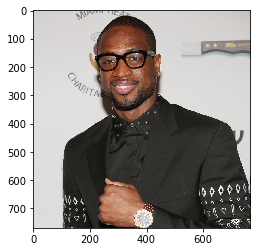

Top 5 Object Detection Predictions
bulletproof_vest (24.14%)
suit (10.99%)
electric_guitar (4.54%)
bow_tie (3.71%)
hatchet (3.25%)
No sunglasses detected.


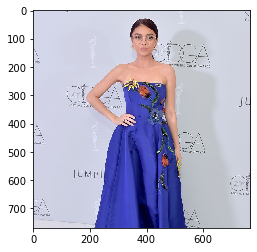

Top 5 Object Detection Predictions
gown (83.01%)
pajama (15.49%)
sarong (1.06%)
overskirt (0.25%)
jean (0.05%)
No sunglasses detected.


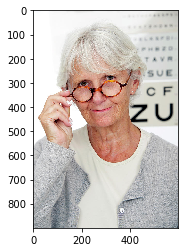

Top 5 Object Detection Predictions
harmonica (22.15%)
cellular_telephone (12.48%)
Band_Aid (7.61%)
paper_towel (5.05%)
toilet_tissue (4.15%)
No sunglasses detected.


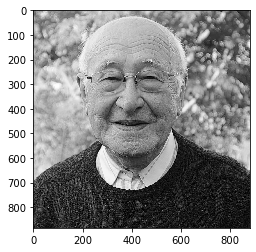

Top 5 Object Detection Predictions
chain_mail (62.11%)
cardigan (7.06%)
pickelhaube (2.40%)
wool (2.07%)
jersey (1.62%)
No sunglasses detected.


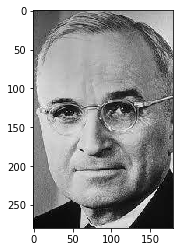

Top 5 Object Detection Predictions
bow_tie (78.45%)
military_uniform (7.51%)
suit (4.83%)
bolo_tie (1.60%)
Windsor_tie (1.59%)
No sunglasses detected.


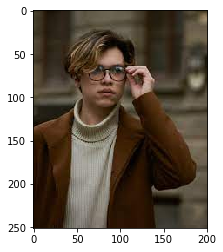

Top 5 Object Detection Predictions
cellular_telephone (6.17%)
suit (5.50%)
neck_brace (3.48%)
Windsor_tie (2.68%)
jean (2.58%)
No sunglasses detected.


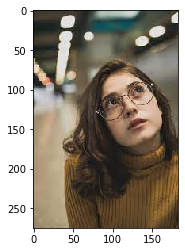

Top 5 Object Detection Predictions
sunglasses (28.21%)
sunglass (20.83%)
abaya (4.10%)
neck_brace (3.20%)
stole (2.55%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


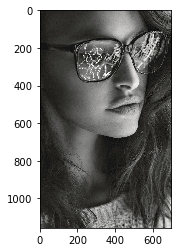

Top 5 Object Detection Predictions
sunglasses (33.61%)
sunglass (21.96%)
seat_belt (11.39%)
feather_boa (2.47%)
wig (2.15%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


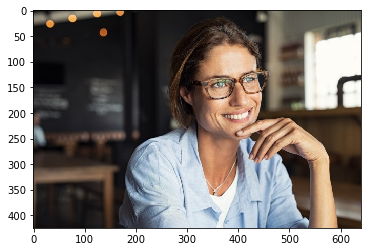

Top 5 Object Detection Predictions
lab_coat (16.35%)
ocarina (8.51%)
cellular_telephone (5.51%)
sunglasses (2.64%)
stethoscope (2.59%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


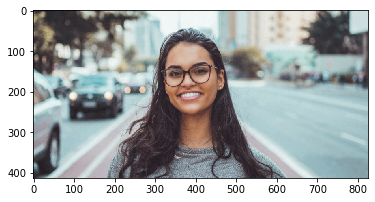

Top 5 Object Detection Predictions
sunglass (19.72%)
sunglasses (18.25%)
abaya (6.98%)
parking_meter (4.97%)
wig (3.85%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


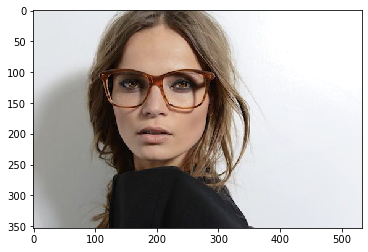

Top 5 Object Detection Predictions
sunglasses (15.40%)
suit (14.44%)
abaya (9.20%)
stole (8.35%)
trench_coat (6.10%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


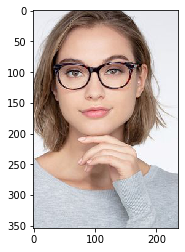

Top 5 Object Detection Predictions
stole (26.59%)
wig (12.06%)
cardigan (8.74%)
poncho (5.77%)
fur_coat (5.74%)
No sunglasses detected.


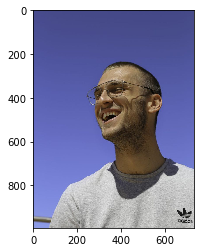

Top 5 Object Detection Predictions
ballplayer (12.27%)
pickelhaube (9.25%)
jersey (8.26%)
military_uniform (5.46%)
bulletproof_vest (3.26%)
No sunglasses detected.


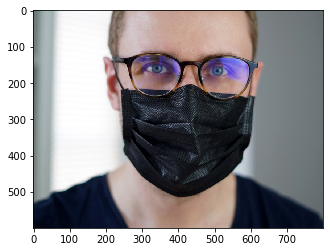

Top 5 Object Detection Predictions
mask (24.96%)
sunglasses (24.10%)
ski_mask (17.98%)
abaya (5.98%)
sunglass (5.66%)
There appears to be sunglasses. Larger glasses are hard to deepfake.


In [19]:
# Do the same thing, but for pictures of glasses

glasses_df = pd.read_csv("libraries and test data/data for model tests/All Labels/sunglasses_glasses.csv", header=0)

folder4_loc='libraries and test data/data for model tests/Sunglasses/Glasses/'

for i in range(0,40):
    img4_index=i
    img4_path = folder4_loc+str(glasses_df['Name'].iloc[img4_index])
    img4 = cv2.imread(img4_path)
    plt.imshow(img4[:, :, ::-1 ])
    plt.show()
    result4=detect_shades(img4_path)
    glasses_df.loc[img4_index, 'Predict (%)'] = result4
    glasses_df.to_csv("libraries and test data/data for model tests/All Labels/sunglasses_glasses.csv", index=False)

In [ ]:
# read testing videos csv
DFD_df = pd.read_csv("libraries and test data/data for model tests/All Labels/sunglasses_glasses.csv", header=0)
# counter
deepfake_item=0